# Visualization of adapted empirical measure generation using different techniques

In [1]:
import sys
import os

# Get the absolute path of src/ directory
notebooks_path = os.path.abspath(os.getcwd())  # Get the notebook’s current directory
src_path = os.path.abspath(os.path.join(notebooks_path, "../src"))

# Ensure src is in sys.path
if src_path not in sys.path:
    sys.path.insert(0, src_path)  # Insert at the beginning to prioritize it

In [2]:
import numpy as np
import warnings
import time

from Measure_sampling.Gen_Path_and_AdaptedTrees import *
from trees.Tree_Node import *
from trees.TreeAnalysis import *
from trees.TreeVisualization import *
from trees.Save_Load_trees import *
from trees.Tree_AWD_utilities import *

from benchmark_value_gaussian.Comp_AWD2_Gaussian import (
    build_mean_and_cov, adapted_wasserstein_squared
)
from awd_trees.Gurobi_AOT import *
from awd_trees.Nested_Dist_Algo import compute_nested_distance

from adapted_empirical_measure.AEM_kMeans import (
    empirical_k_means_measure,
    empirical_k_means_measure_new,
    empirical_k_means_measure_grid,
)
from adapted_empirical_measure.AEM_grid import empirical_grid_measure, uniform_empirical_grid_measure


# Suppress sklearn warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

## For report

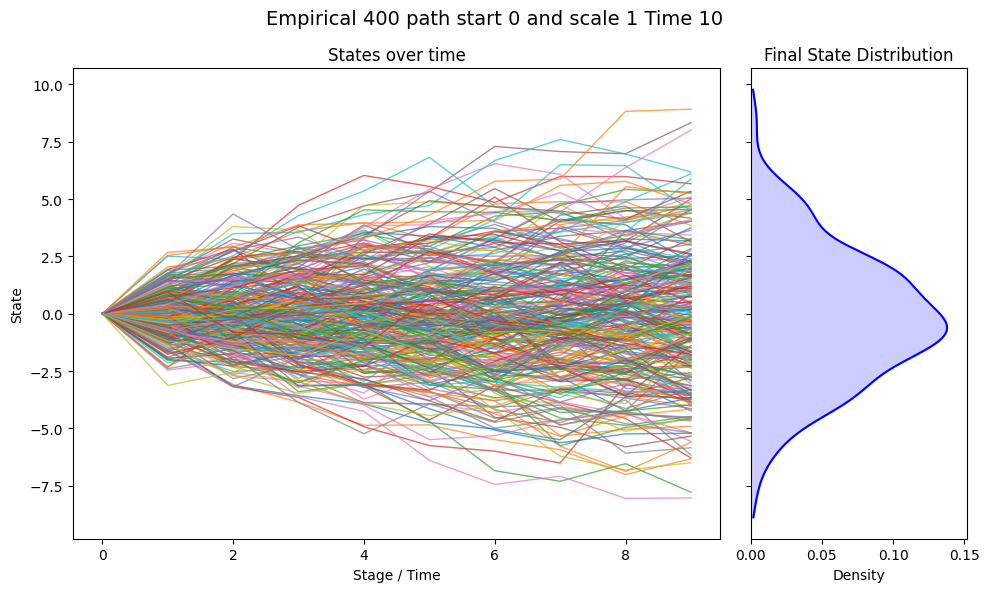

300


In [3]:
t = 10
num_path = 300
start = 0
scale = 1
paths_iid = generate_brownian_motion(
    num_paths=num_path, time_steps=t, x_init=start, scale=scale, return_time=False
)
weights_iid = np.full(num_path, 1 / num_path)

root = build_tree_from_paths(paths_iid, weights_iid)

visualize_big_tree(
    root, fig_size=(10, 6), title="Empirical 400 path start 0 and scale 1 Time 10"
)
formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

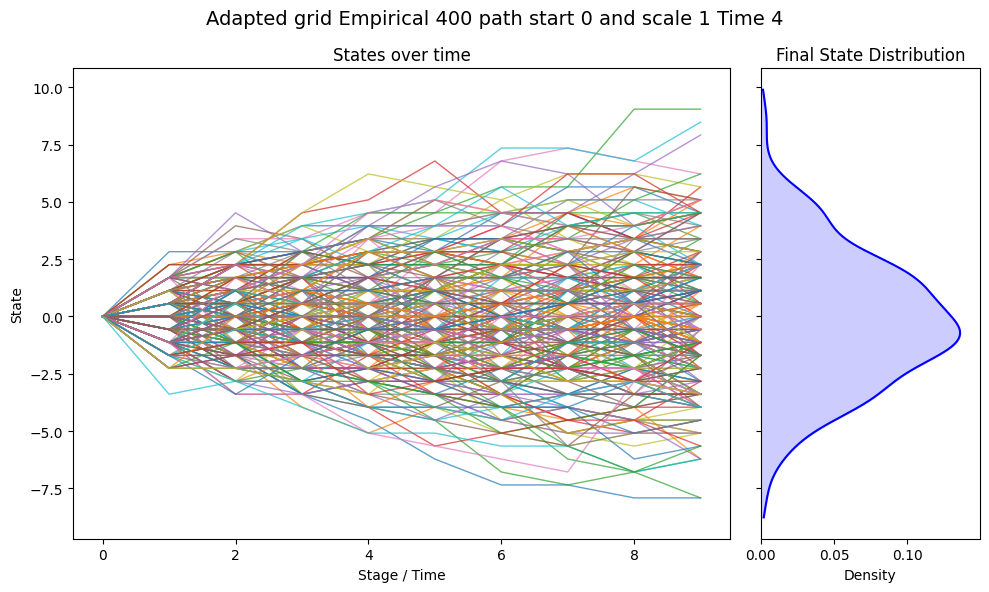

300


In [4]:
delta_n = 1/(num_path**(1/((t-1)+1))) #t-1 = non trivial time step and +1 for fomrula

new_sample_paths, new_weights = uniform_empirical_grid_measure(paths_iid, delta_n, use_weights=True) # Grid with number of grid points as in papers [0,1] divided into: 1/N^r with R=1/(T+1).
root = build_tree_from_paths(new_sample_paths, new_weights)

visualize_big_tree(
    root,
    fig_size=(10, 6),
    title="Adapted grid Empirical 400 path start 0 and scale 1 Time 4",
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

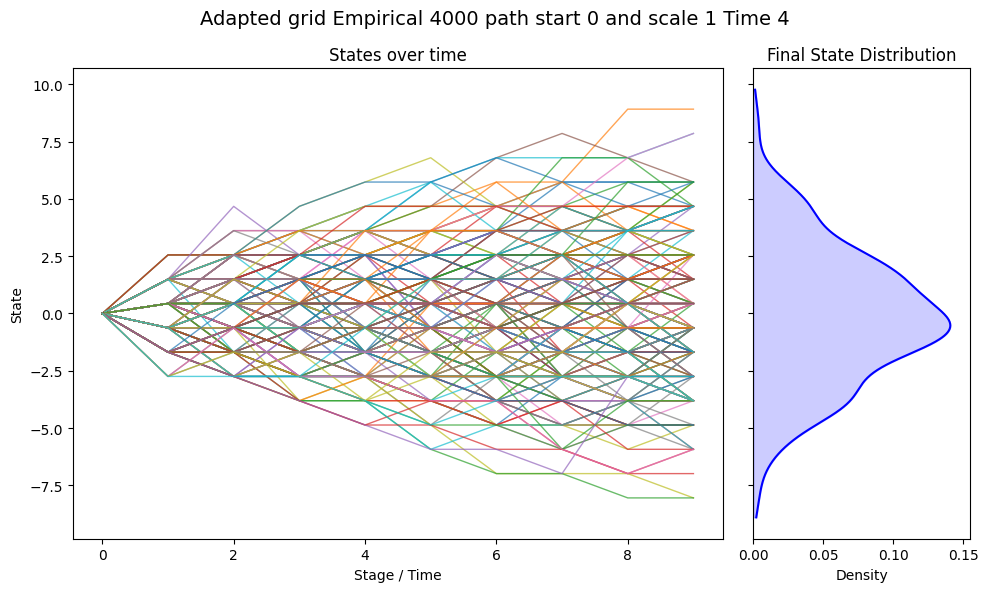

300


In [5]:
new_sample_paths, new_weights = empirical_grid_measure(paths_iid, use_weights=True) # sqrt N point on the grid -> very "spaced" grid
root = build_tree_from_paths(new_sample_paths, new_weights)

visualize_big_tree(
    root,
    fig_size=(10, 6),
    title="Adapted grid Empirical 4000 path start 0 and scale 1 Time 4",
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

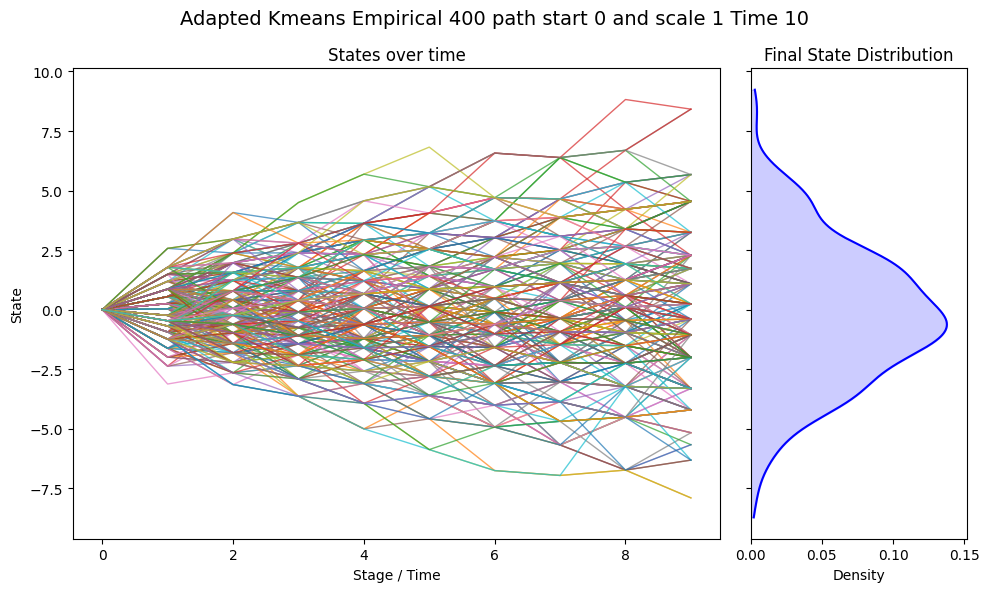

300


In [6]:
new_sample_paths, new_weights = empirical_k_means_measure(paths_iid, use_weights=True) # sqrt N centroid at each time
root = build_tree_from_paths(new_sample_paths, new_weights)

visualize_big_tree(
    root,
    fig_size=(10, 6),
    title="Adapted Kmeans Empirical 400 path start 0 and scale 1 Time 10",
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

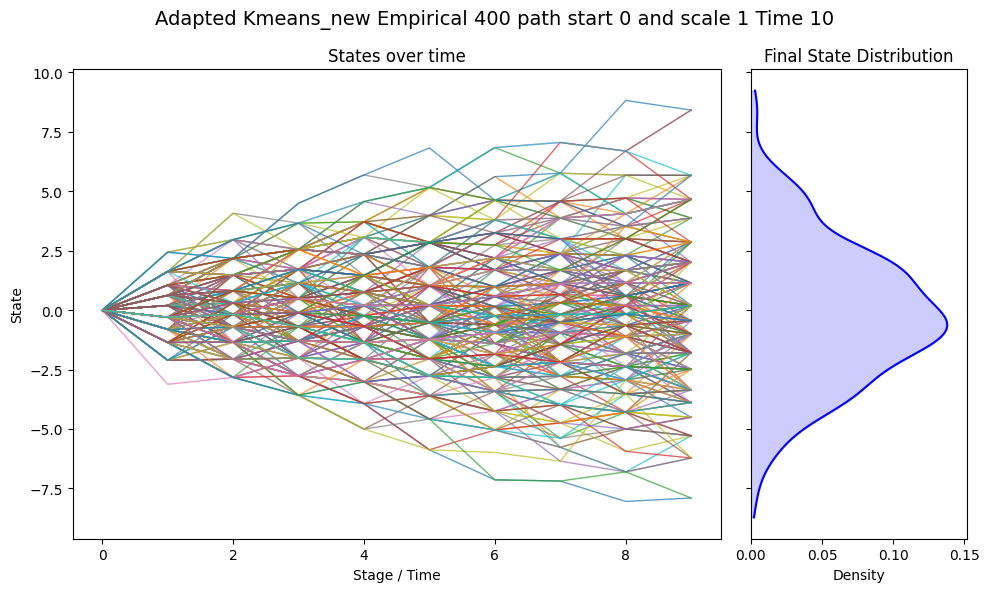

300


In [7]:
new_sample_paths, new_weights = empirical_k_means_measure_new( # sqrt N centroid at each time sclaed by variance
    paths_iid, use_weights=True
)
root = build_tree_from_paths(new_sample_paths, new_weights)

visualize_big_tree(
    root,
    fig_size=(10, 6),
    title="Adapted Kmeans_new Empirical 400 path start 0 and scale 1 Time 10",
)
formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

# Ingore bellow

## For 4 time step scale 1 and x_init = 0

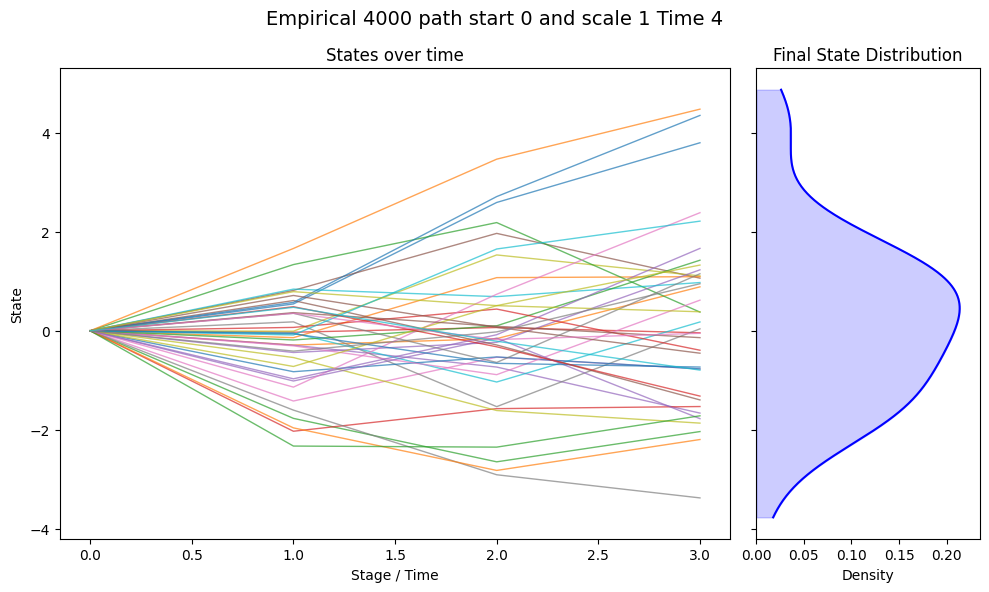

40


In [18]:
t = 4
num_path = 40
start = 0
scale = 1
paths_iid = generate_brownian_motion(
    num_paths=num_path, time_steps=t, x_init=start, scale=scale, return_time=False
)
weights_iid = np.full(num_path, 1 / num_path)

root = build_tree_from_paths(paths_iid, weights_iid)

visualize_big_tree(
    root, fig_size=(10, 6), title="Empirical 4000 path start 0 and scale 1 Time 4"
)
formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

## Kmeans

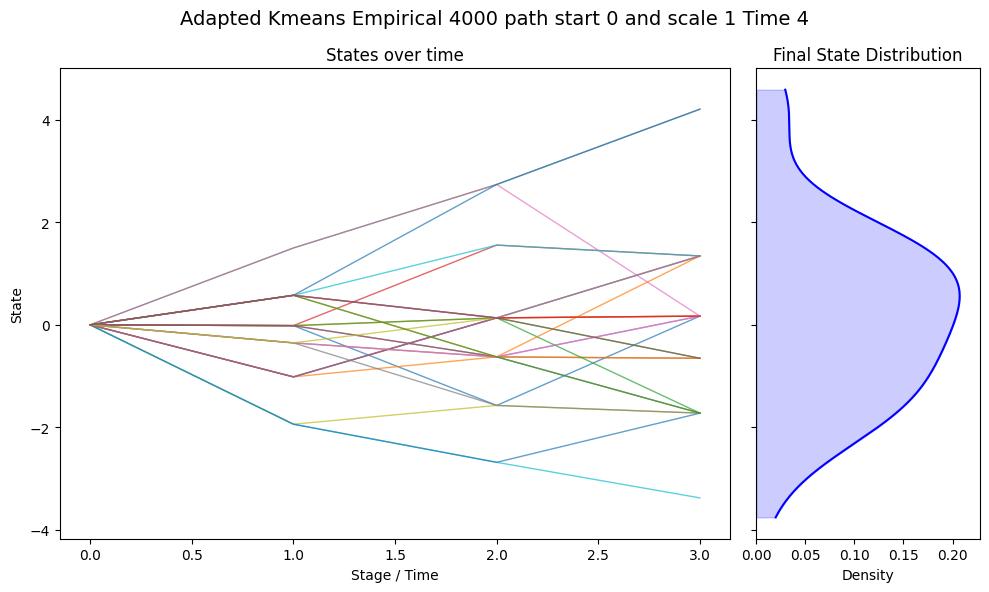

26


In [19]:
new_sample_paths, new_weights = empirical_k_means_measure(paths_iid, use_weights=True)
root = build_tree_from_paths(new_sample_paths, new_weights)

visualize_big_tree(
    root,
    fig_size=(10, 6),
    title="Adapted Kmeans Empirical 4000 path start 0 and scale 1 Time 4",
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

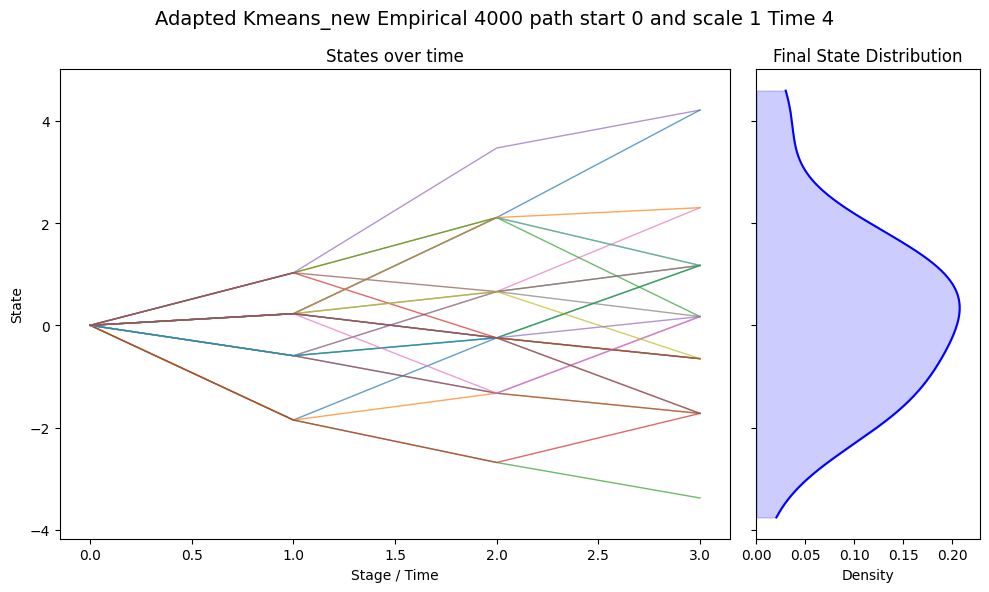

26


In [20]:
new_sample_paths, new_weights = empirical_k_means_measure_new(
    paths_iid, use_weights=True
)
root = build_tree_from_paths(new_sample_paths, new_weights)

visualize_big_tree(
    root,
    fig_size=(10, 6),
    title="Adapted Kmeans_new Empirical 4000 path start 0 and scale 1 Time 4",
)
formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

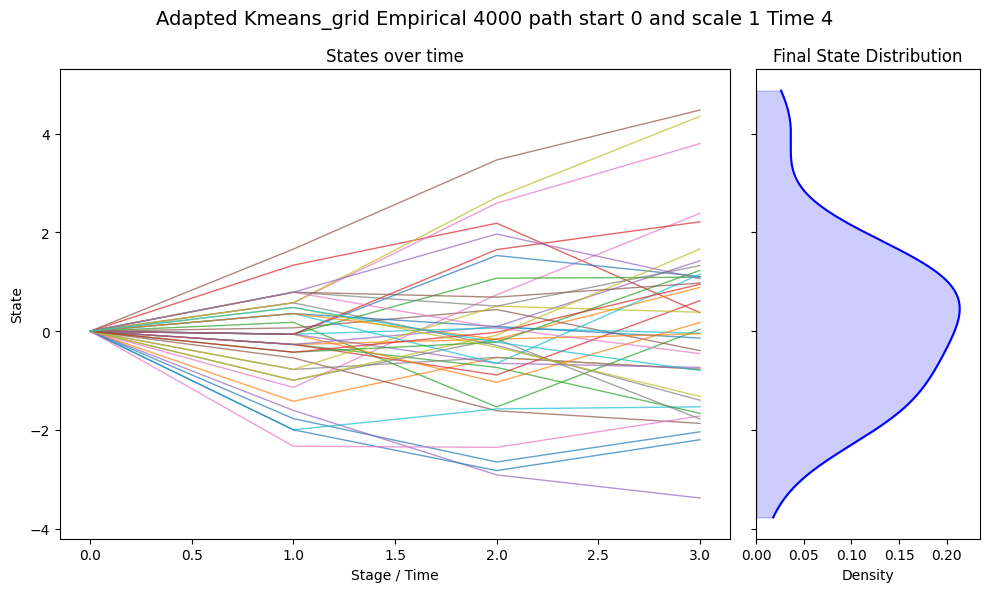

40


In [21]:
new_sample_paths, new_weights = empirical_k_means_measure_grid(
    paths_iid, use_weights=True
)
root = build_tree_from_paths(new_sample_paths, new_weights)

visualize_big_tree(
    root,
    fig_size=(10, 6),
    title="Adapted Kmeans_grid Empirical 4000 path start 0 and scale 1 Time 4",
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

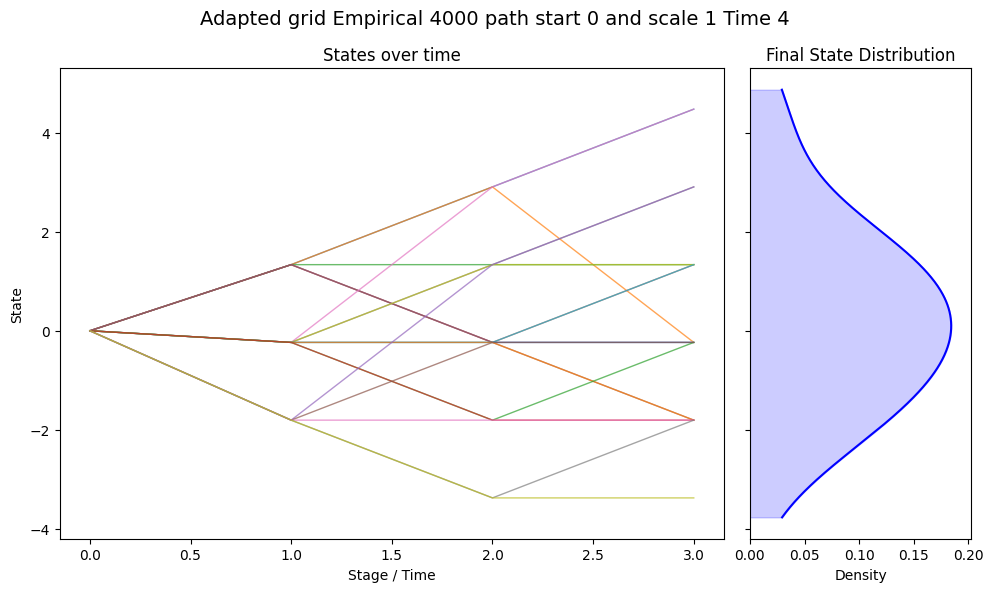

19


In [22]:
new_sample_paths, new_weights = empirical_grid_measure(paths_iid, use_weights=True)
root = build_tree_from_paths(new_sample_paths, new_weights)

visualize_big_tree(
    root,
    fig_size=(10, 6),
    title="Adapted grid Empirical 4000 path start 0 and scale 1 Time 4",
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

## Same but with 10 times step

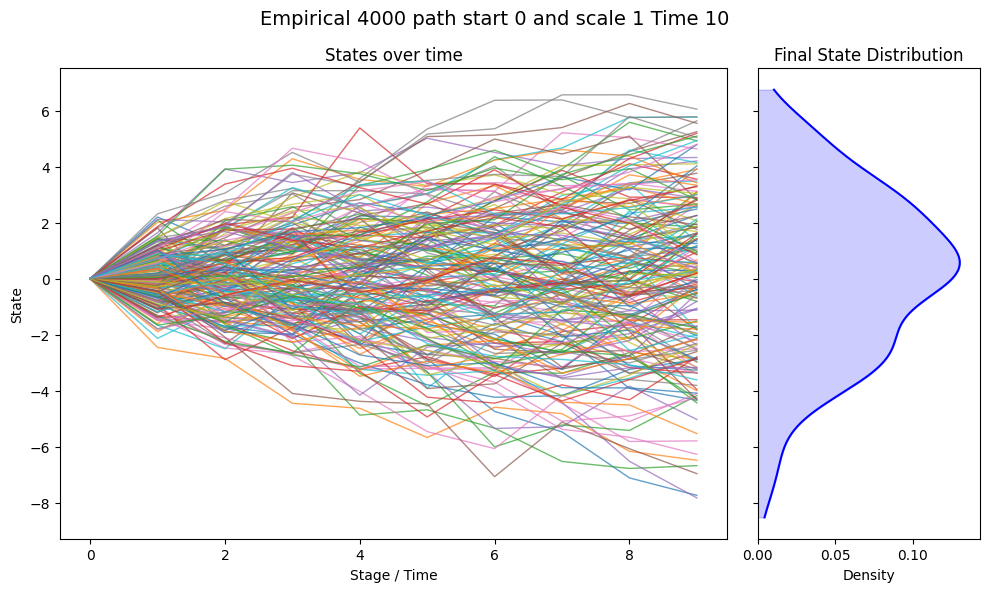

200


In [35]:
t = 10
num_path = 200
start = 0
scale = 1
paths_iid = generate_brownian_motion(
    num_paths=num_path, time_steps=t, x_init=start, scale=scale, return_time=False
)
weights_iid = np.full(num_path, 1 / num_path)

root = build_tree_from_paths(paths_iid, weights_iid)

visualize_big_tree(
    root, fig_size=(10, 6), title="Empirical 4000 path start 0 and scale 1 Time 10"
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

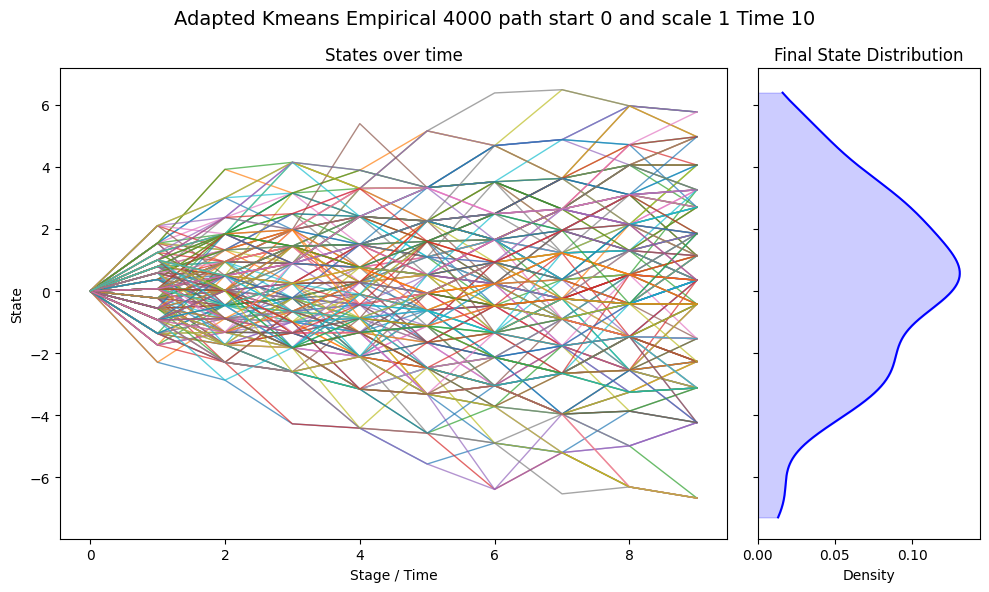

200


In [36]:
new_sample_paths, new_weights = empirical_k_means_measure(paths_iid, use_weights=True)
root = build_tree_from_paths(new_sample_paths, new_weights)

visualize_big_tree(
    root,
    fig_size=(10, 6),
    title="Adapted Kmeans Empirical 4000 path start 0 and scale 1 Time 10",
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

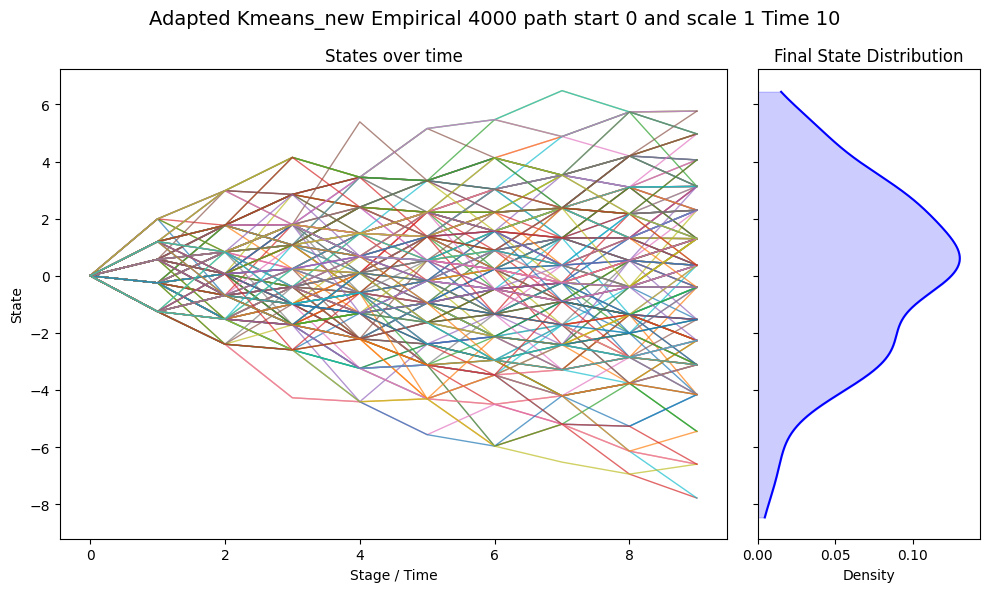

200


In [37]:
new_sample_paths, new_weights = empirical_k_means_measure_new(
    paths_iid, use_weights=True
)
root = build_tree_from_paths(new_sample_paths, new_weights)

visualize_big_tree(
    root,
    fig_size=(10, 6),
    title="Adapted Kmeans_new Empirical 4000 path start 0 and scale 1 Time 10",
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

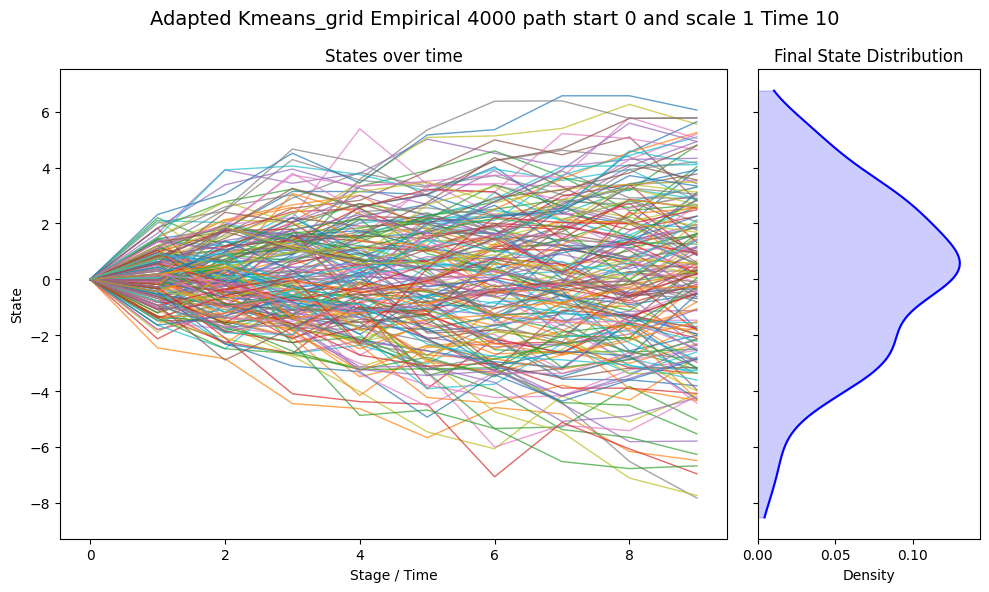

200


In [38]:
new_sample_paths, new_weights = empirical_k_means_measure_grid(
    paths_iid, use_weights=True
)
root = build_tree_from_paths(new_sample_paths, new_weights)

visualize_big_tree(
    root,
    fig_size=(10, 6),
    title="Adapted Kmeans_grid Empirical 4000 path start 0 and scale 1 Time 10",
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

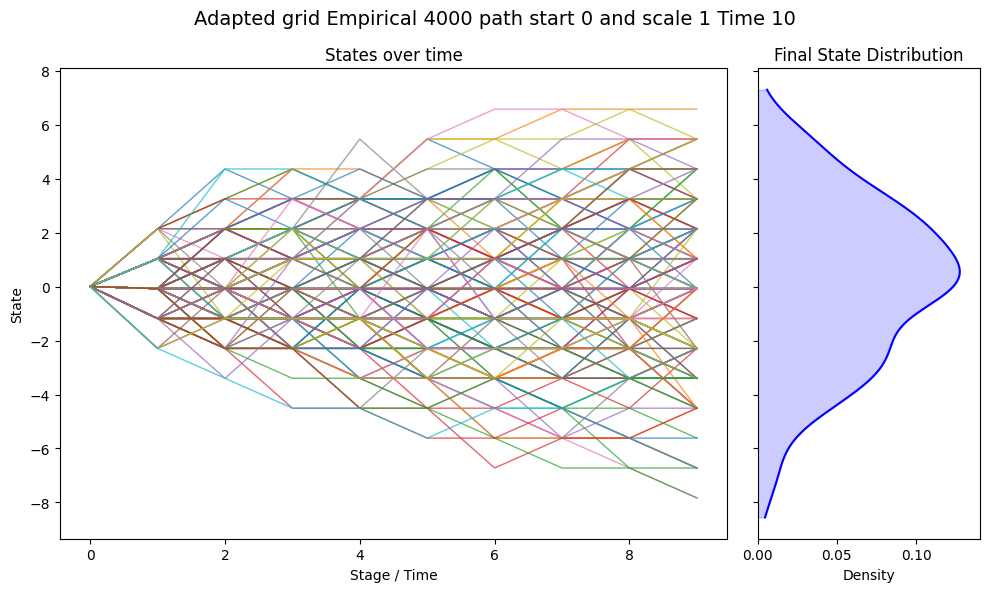

200


In [39]:
new_sample_paths, new_weights = empirical_grid_measure(paths_iid, use_weights=True)
root = build_tree_from_paths(new_sample_paths, new_weights)

visualize_big_tree(
    root,
    fig_size=(10, 6),
    title="Adapted grid Empirical 4000 path start 0 and scale 1 Time 10",
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

## For 4 time step scale 3 and x_init = 0

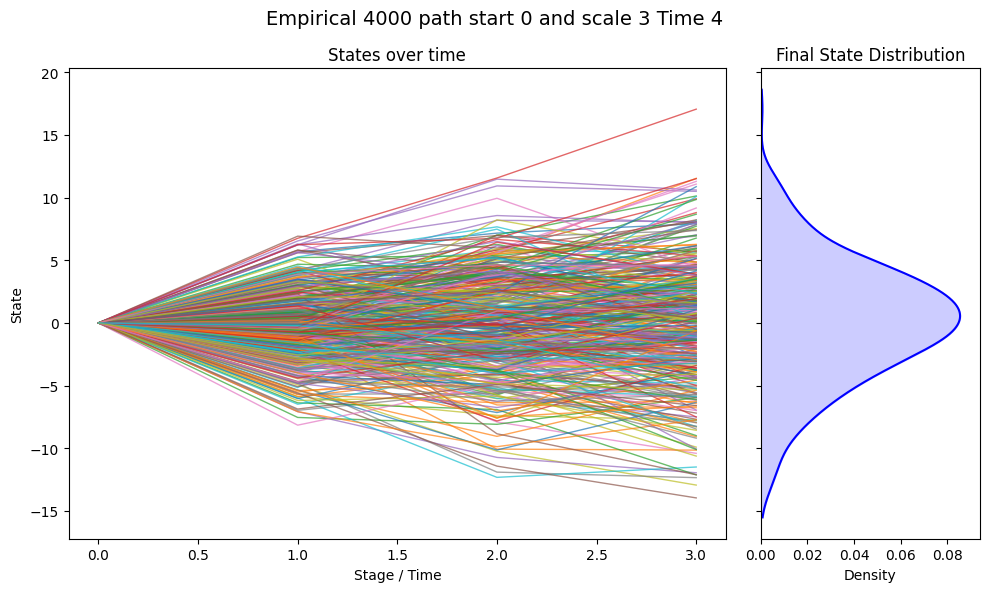

400


In [44]:
t = 4
num_path = 400
start = 0
scale = 3
paths_iid = generate_brownian_motion(
    num_paths=num_path, time_steps=t, x_init=start, scale=scale, return_time=False
)
weights_iid = np.full(num_path, 1 / num_path)

root = build_tree_from_paths(paths_iid, weights_iid)

visualize_big_tree(
    root, fig_size=(10, 6), title="Empirical 4000 path start 0 and scale 3 Time 4"
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

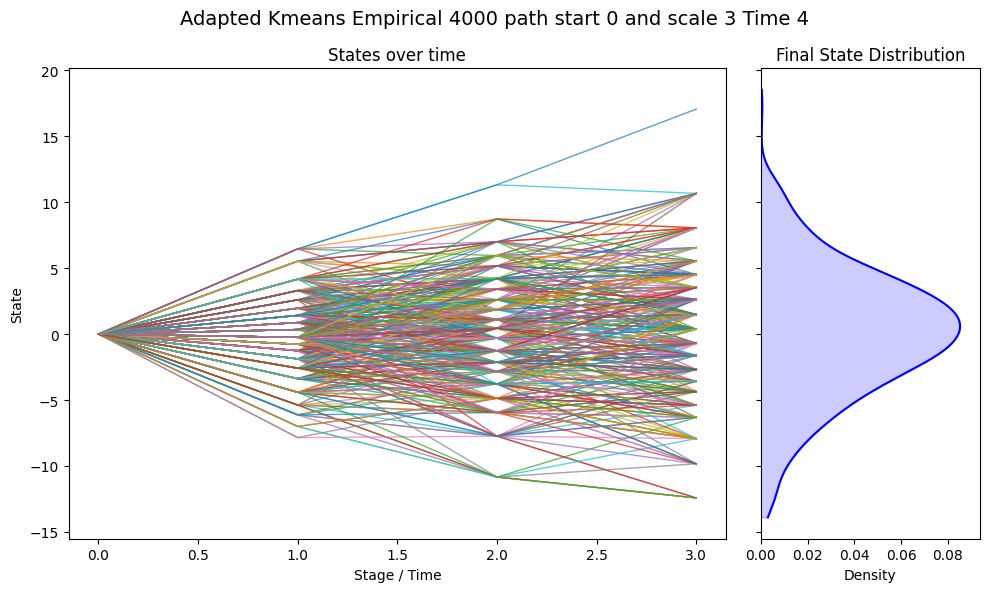

368


In [45]:
new_sample_paths, new_weights = empirical_k_means_measure(paths_iid, use_weights=True)
root = build_tree_from_paths(new_sample_paths, new_weights)

visualize_big_tree(
    root,
    fig_size=(10, 6),
    title="Adapted Kmeans Empirical 4000 path start 0 and scale 3 Time 4",
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

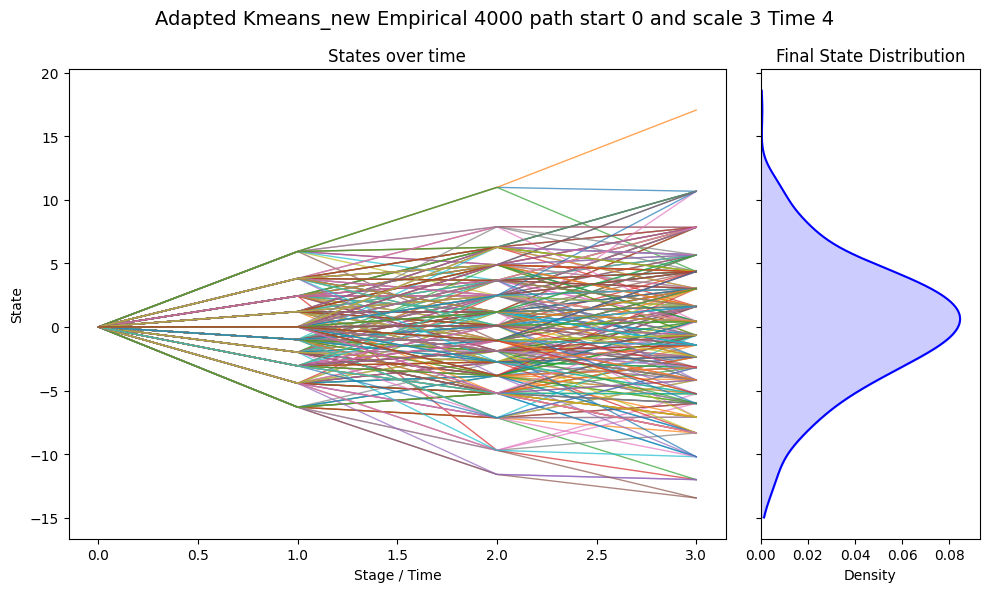

314


In [46]:
new_sample_paths, new_weights = empirical_k_means_measure_new(
    paths_iid, use_weights=True
)
root = build_tree_from_paths(new_sample_paths, new_weights)

visualize_big_tree(
    root,
    fig_size=(10, 6),
    title="Adapted Kmeans_new Empirical 4000 path start 0 and scale 3 Time 4",
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

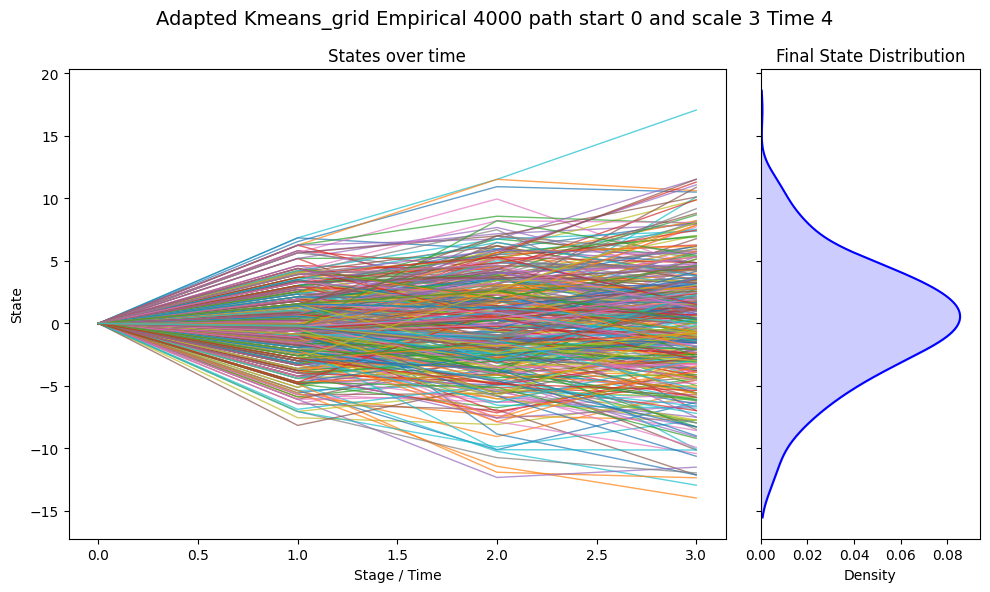

400


In [47]:
new_sample_paths, new_weights = empirical_k_means_measure_grid(
    paths_iid, use_weights=True
)
root = build_tree_from_paths(new_sample_paths, new_weights)

visualize_big_tree(
    root,
    fig_size=(10, 6),
    title="Adapted Kmeans_grid Empirical 4000 path start 0 and scale 3 Time 4",
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

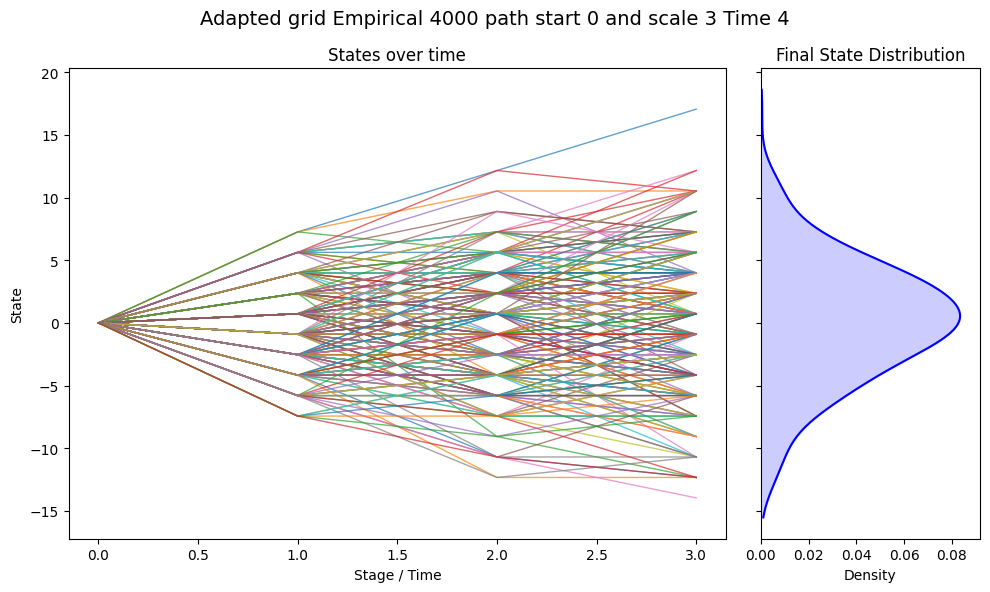

244


In [48]:
new_sample_paths, new_weights = empirical_grid_measure(paths_iid, use_weights=True)
root = build_tree_from_paths(new_sample_paths, new_weights)

visualize_big_tree(
    root,
    fig_size=(10, 6),
    title="Adapted grid Empirical 4000 path start 0 and scale 3 Time 4",
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

## Same but with 10 time step

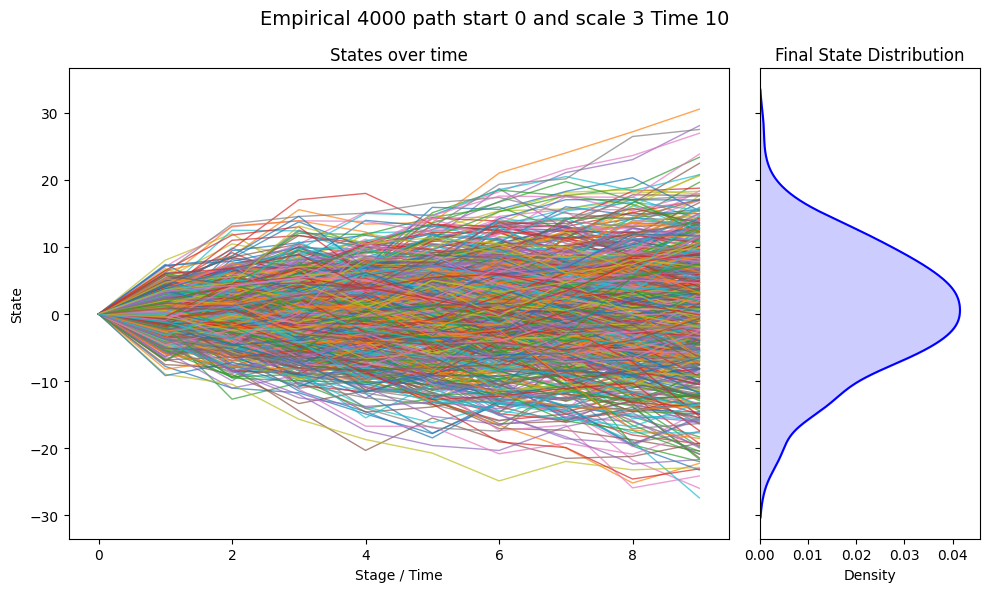

800


In [53]:
t = 10
num_path = 800
start = 0
scale = 3
paths_iid = generate_brownian_motion(
    num_paths=num_path, time_steps=t, x_init=start, scale=scale, return_time=False
)
weights_iid = np.full(num_path, 1 / num_path)

root = build_tree_from_paths(paths_iid, weights_iid)

visualize_big_tree(
    root, fig_size=(10, 6), title="Empirical 4000 path start 0 and scale 3 Time 10"
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

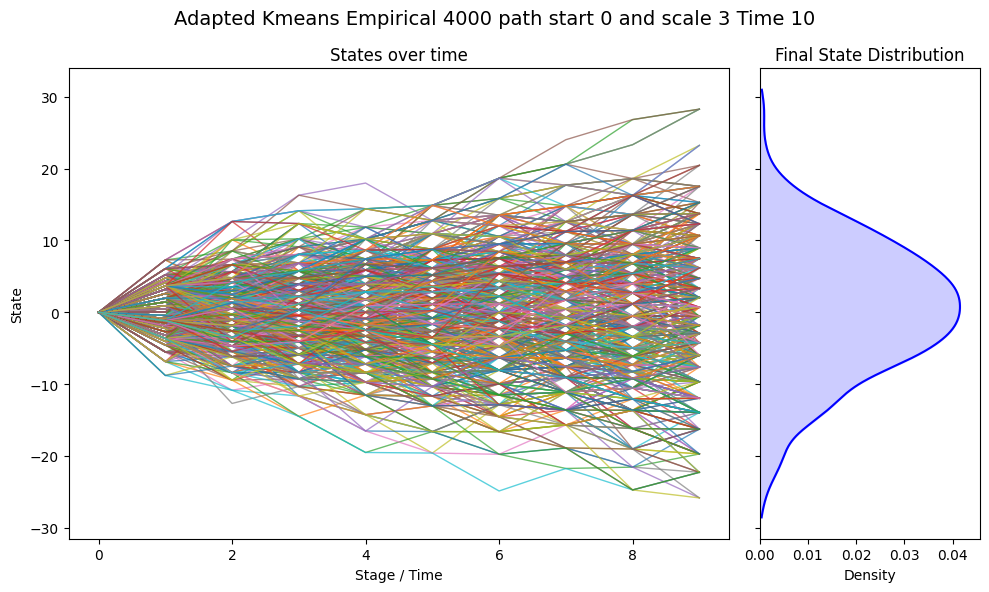

800


In [54]:
new_sample_paths, new_weights = empirical_k_means_measure(paths_iid, use_weights=True)
root = build_tree_from_paths(new_sample_paths, new_weights)

visualize_big_tree(
    root,
    fig_size=(10, 6),
    title="Adapted Kmeans Empirical 4000 path start 0 and scale 3 Time 10",
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

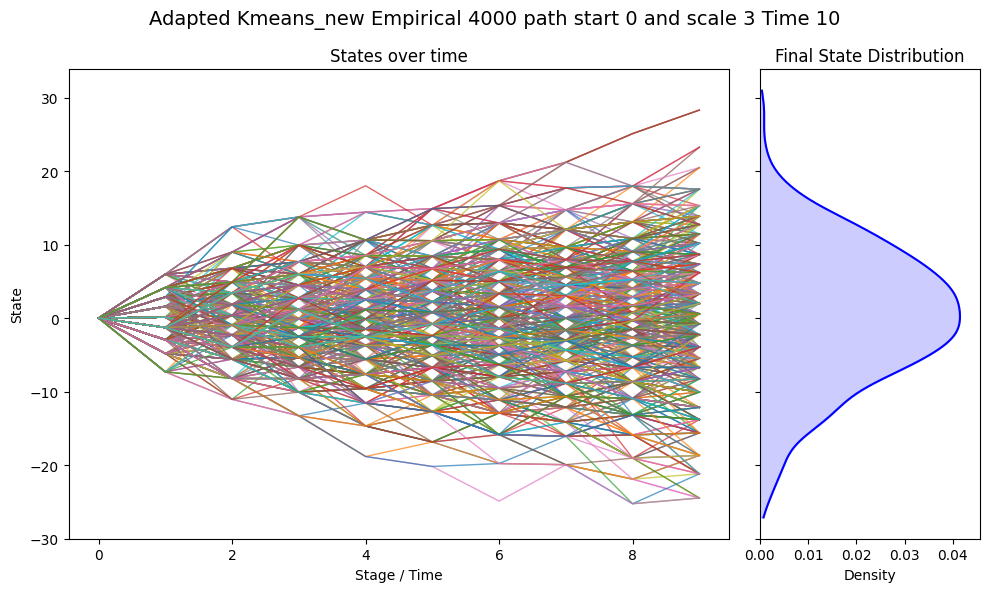

800


In [55]:
new_sample_paths, new_weights = empirical_k_means_measure_new(
    paths_iid, use_weights=True
)
root = build_tree_from_paths(new_sample_paths, new_weights)

visualize_big_tree(
    root,
    fig_size=(10, 6),
    title="Adapted Kmeans_new Empirical 4000 path start 0 and scale 3 Time 10",
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

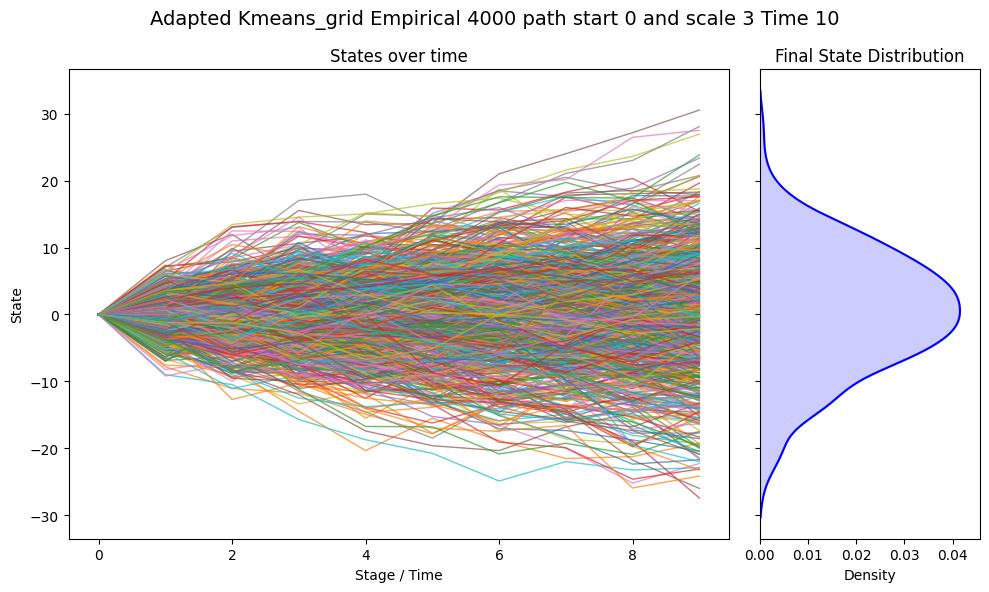

800


In [56]:
new_sample_paths, new_weights = empirical_k_means_measure_grid(
    paths_iid, use_weights=True
)
root = build_tree_from_paths(new_sample_paths, new_weights)

visualize_big_tree(
    root,
    fig_size=(10, 6),
    title="Adapted Kmeans_grid Empirical 4000 path start 0 and scale 3 Time 10",
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

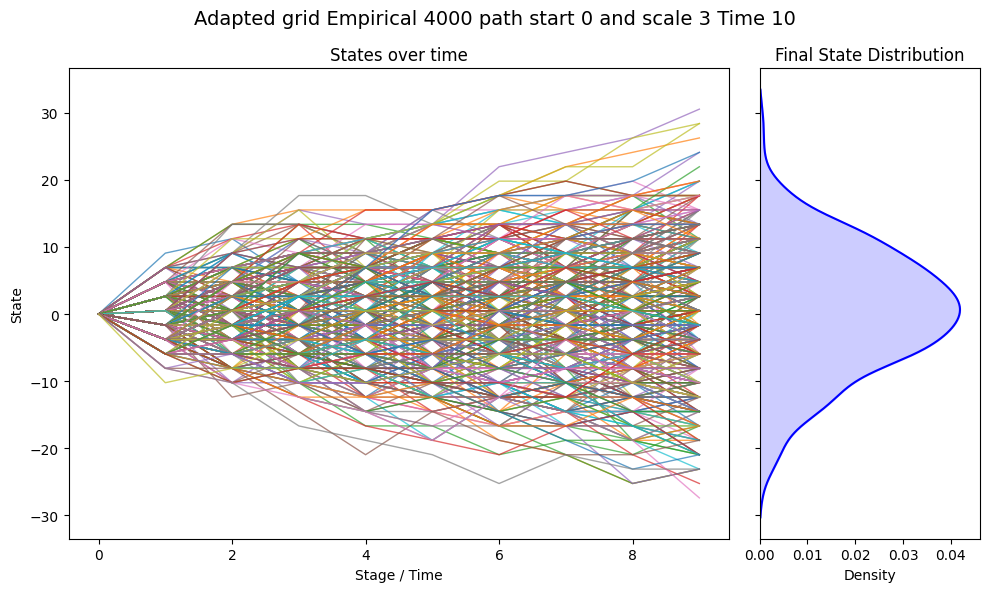

799


In [57]:
new_sample_paths, new_weights = empirical_grid_measure(paths_iid, use_weights=True)
root = build_tree_from_paths(new_sample_paths, new_weights)

visualize_big_tree(
    root,
    fig_size=(10, 6),
    title="Adapted grid Empirical 4000 path start 0 and scale 3 Time 10",
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

## For 4 time step scale 0.5 and x_init = 2

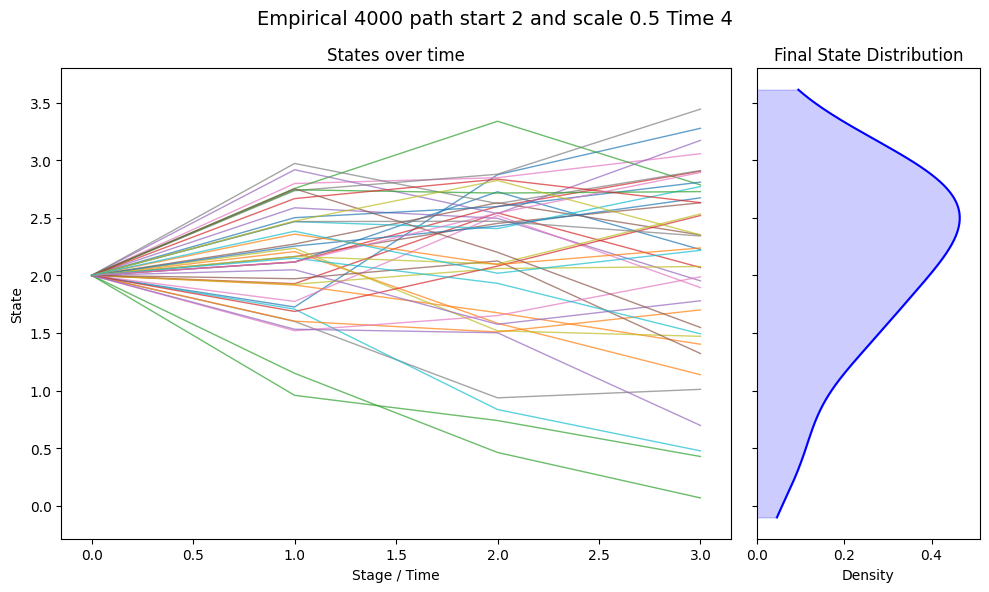

40


In [58]:
t = 4
num_path = 40
start = 2
scale = 0.5
paths_iid = generate_brownian_motion(
    num_paths=num_path, time_steps=t, x_init=start, scale=scale, return_time=False
)
weights_iid = np.full(num_path, 1 / num_path)

root = build_tree_from_paths(paths_iid, weights_iid)

visualize_big_tree(
    root, fig_size=(10, 6), title="Empirical 4000 path start 2 and scale 0.5 Time 4"
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

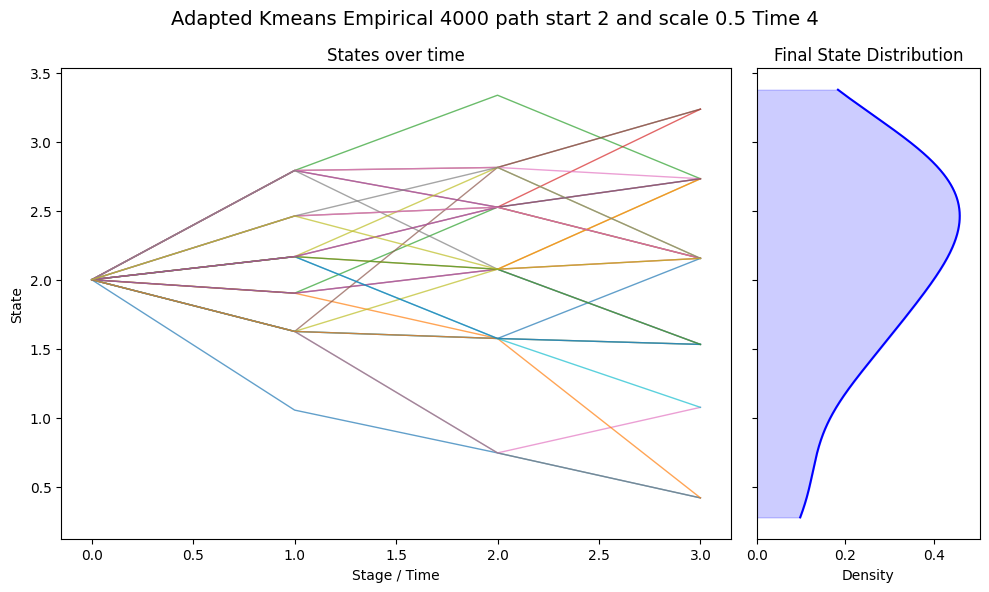

29


In [59]:
new_sample_paths, new_weights = empirical_k_means_measure(paths_iid, use_weights=True)
root = build_tree_from_paths(new_sample_paths, new_weights)

visualize_big_tree(
    root,
    fig_size=(10, 6),
    title="Adapted Kmeans Empirical 4000 path start 2 and scale 0.5 Time 4",
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

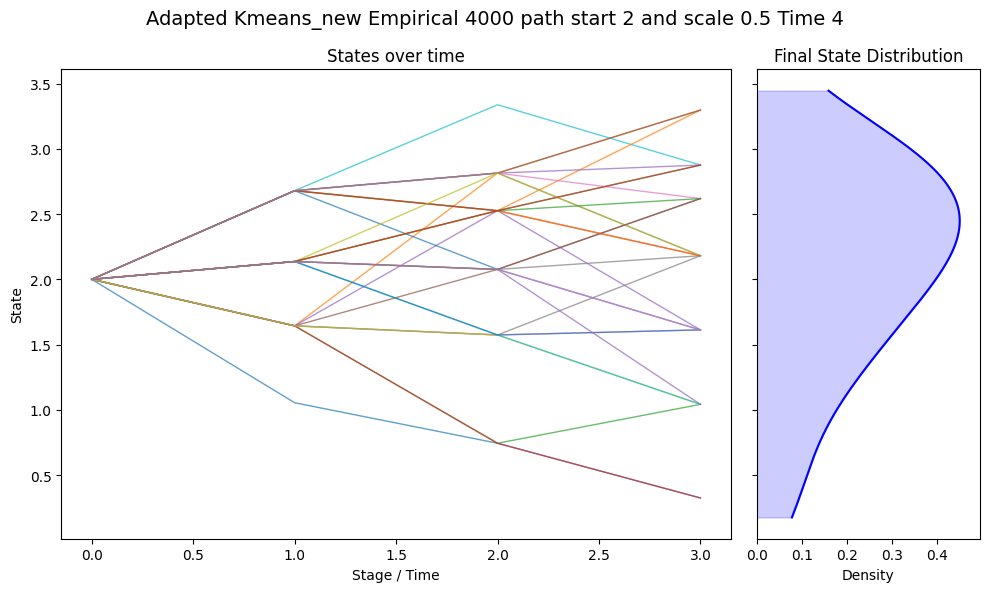

28


In [60]:
new_sample_paths, new_weights = empirical_k_means_measure_new(
    paths_iid, use_weights=True
)
root = build_tree_from_paths(new_sample_paths, new_weights)

visualize_big_tree(
    root,
    fig_size=(10, 6),
    title="Adapted Kmeans_new Empirical 4000 path start 2 and scale 0.5 Time 4",
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

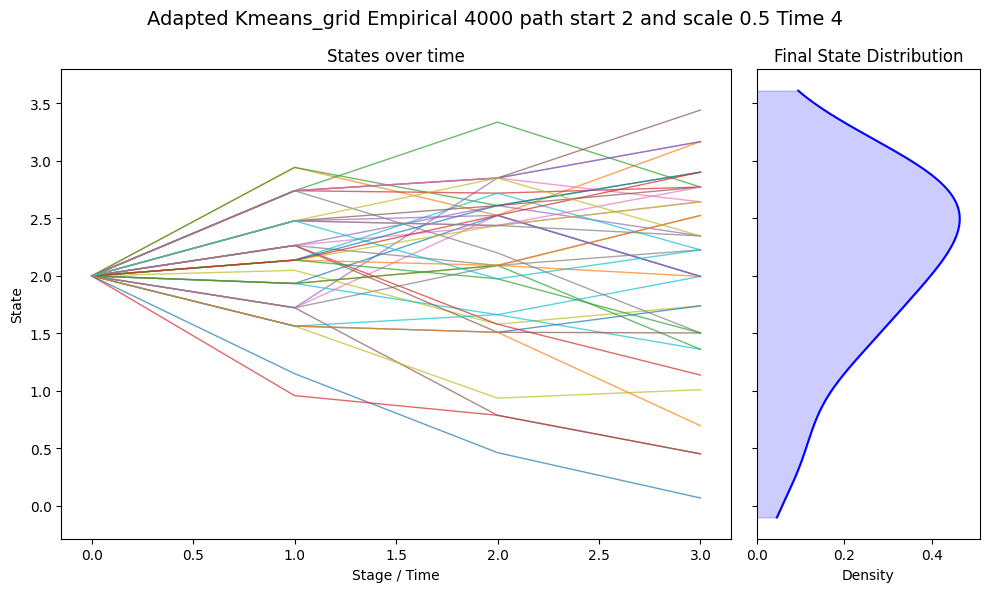

40


In [61]:
new_sample_paths, new_weights = empirical_k_means_measure_grid(
    paths_iid, use_weights=True
)
root = build_tree_from_paths(new_sample_paths, new_weights)

visualize_big_tree(
    root,
    fig_size=(10, 6),
    title="Adapted Kmeans_grid Empirical 4000 path start 2 and scale 0.5 Time 4",
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

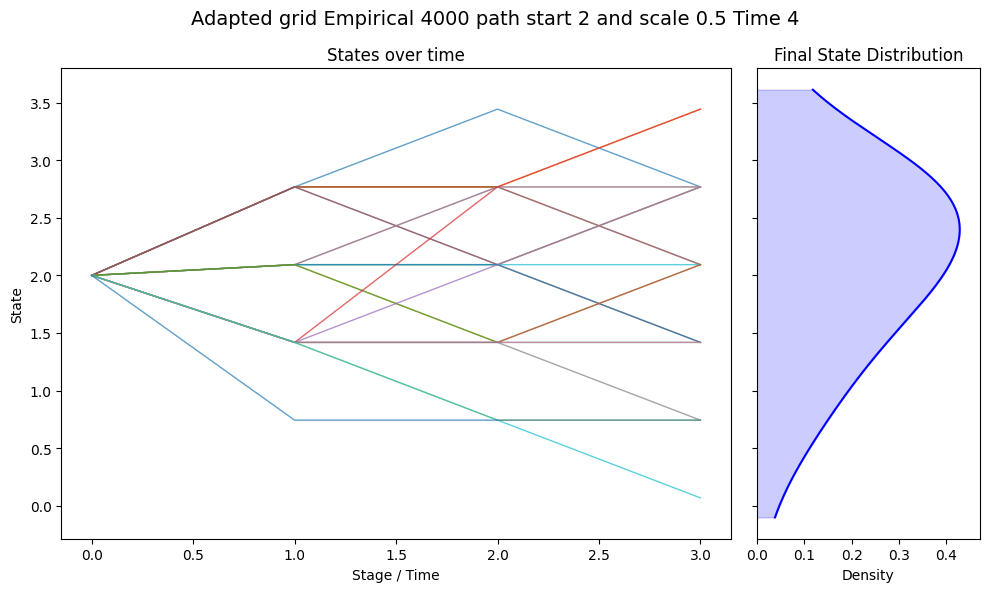

21


In [62]:
new_sample_paths, new_weights = empirical_grid_measure(paths_iid, use_weights=True)
root = build_tree_from_paths(new_sample_paths, new_weights)

visualize_big_tree(
    root,
    fig_size=(10, 6),
    title="Adapted grid Empirical 4000 path start 2 and scale 0.5 Time 4",
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

## Same but with 10 time step

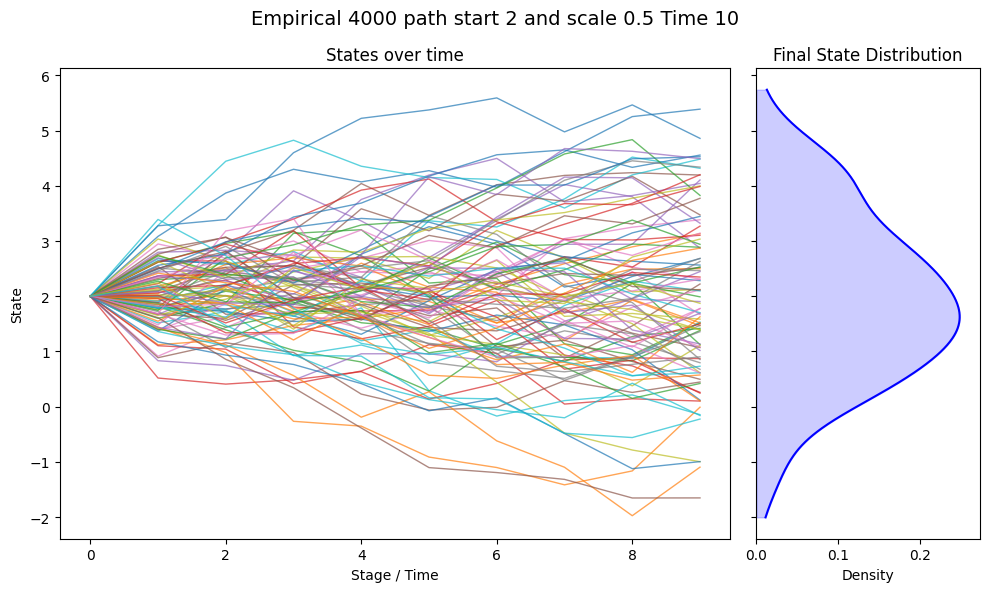

100


In [63]:
t = 10
num_path = 100
start = 2
scale = 0.5
paths_iid = generate_brownian_motion(
    num_paths=num_path, time_steps=t, x_init=start, scale=scale, return_time=False
)
weights_iid = np.full(num_path, 1 / num_path)

root = build_tree_from_paths(paths_iid, weights_iid)

visualize_big_tree(
    root, fig_size=(10, 6), title="Empirical 4000 path start 2 and scale 0.5 Time 10"
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

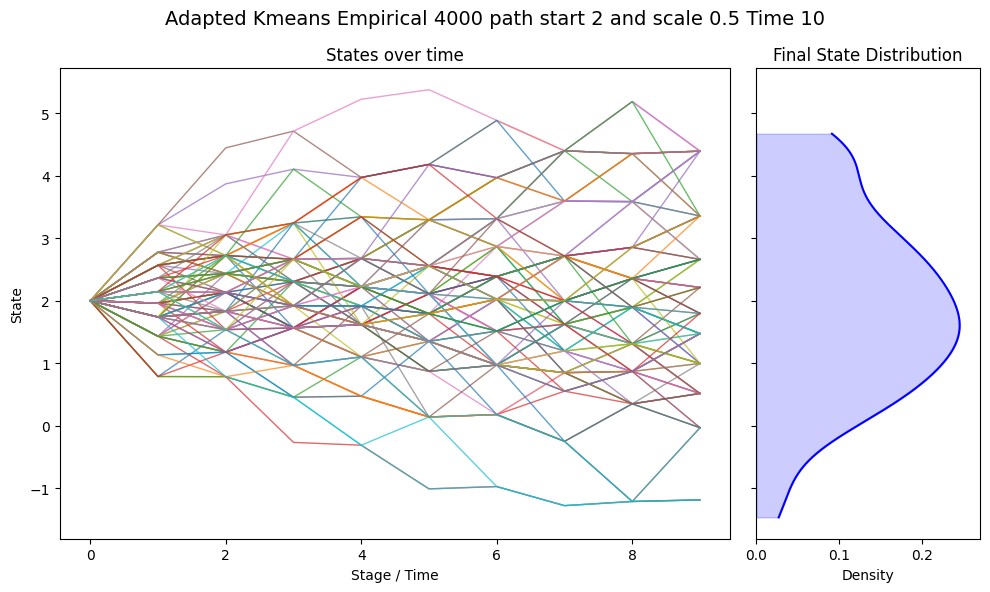

100


In [64]:
new_sample_paths, new_weights = empirical_k_means_measure(paths_iid, use_weights=True)
root = build_tree_from_paths(new_sample_paths, new_weights)

visualize_big_tree(
    root,
    fig_size=(10, 6),
    title="Adapted Kmeans Empirical 4000 path start 2 and scale 0.5 Time 10",
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))

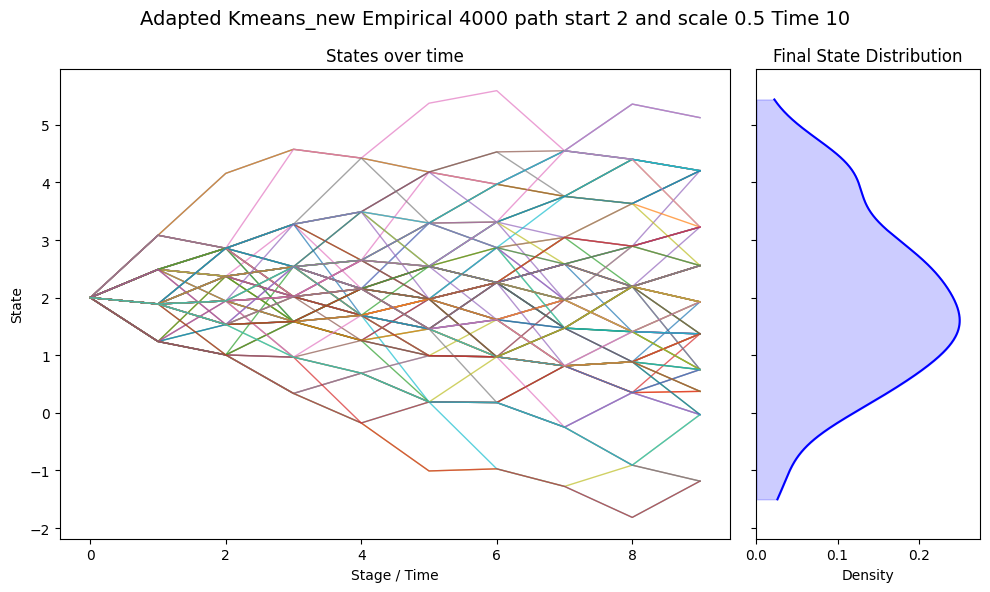

100


In [65]:
new_sample_paths, new_weights = empirical_k_means_measure_new(
    paths_iid, use_weights=True
)
root = build_tree_from_paths(new_sample_paths, new_weights)

visualize_big_tree(
    root,
    fig_size=(10, 6),
    title="Adapted Kmeans_new Empirical 4000 path start 2 and scale 0.5 Time 10",
)

formatted_tree_1 = get_sample_paths(root)
print(len(formatted_tree_1[1]))